In [1]:
import pandas as pd
import numpy as np
import geopandas as gpd
import networkx as nx
import os
import matplotlib.pyplot as plt
from matplotlib.pyplot import cm
import json
import re
from shapely.geometry import Point, LineString
from scipy.spatial import distance
import osmnx as ox

### Load bus stop shapefile data

In [2]:
# 1. read bus stops geojson
bus_stops = gpd.read_file('data/raw/tfl/Bus_Stops.geojson')
bus_stops = bus_stops.to_crs(epsg=27700)
bus_stops['STOP_CODE'] = bus_stops['STOP_CODE'].astype(str).str.strip() # CONVERT STOP_CODE TO STR

# 2. load bus stop data
bus_stops1 = pd.read_csv('data/raw/tfl/bus-stops.csv')
bus_stops1['Bus_Stop_Code'] = bus_stops1['Bus_Stop_Code'].astype(str).str.strip() # CONVERT STOP_CODE TO STR

# combine bus_stops and bus_stops1 with stop_code
bus_stops = bus_stops.merge(bus_stops1, left_on='STOP_CODE', right_on='Stop_Code_LBSL', how='outer')

# fill stop_code with Stop_Code_LBSL
bus_stops['STOP_CODE'] = bus_stops['STOP_CODE'].fillna(bus_stops['Stop_Code_LBSL'])
bus_stops['STOP_NAME'] = bus_stops['STOP_NAME'].fillna(bus_stops['Stop_Name'])
bus_stops['OS_EASTING'] = bus_stops['OS_EASTING'].fillna(bus_stops['Location_Easting'])
bus_stops['OS_NORTHING'] = bus_stops['OS_NORTHING'].fillna(bus_stops['Location_Northing'])
bus_stops['geometry'] = [Point(x, y) for x, y in zip(bus_stops['OS_EASTING'], bus_stops['OS_NORTHING'])]

# filter to necessary columns
bus_stops = bus_stops[['STOP_CODE', 'STOP_NAME', 'OS_EASTING', 'OS_NORTHING','geometry']]
bus_stops = gpd.GeoDataFrame(bus_stops, geometry='geometry', crs='epsg:27700')
bus_stops.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 21540 entries, 0 to 21539
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   STOP_CODE    21540 non-null  object  
 1   STOP_NAME    21517 non-null  object  
 2   OS_EASTING   21540 non-null  float64 
 3   OS_NORTHING  21540 non-null  float64 
 4   geometry     21540 non-null  geometry
dtypes: float64(2), geometry(1), object(2)
memory usage: 841.5+ KB


In [3]:
# create bus_edges
bus_segments = gpd.read_file(os.path.join('data','raw','tfl','Bus_Routes_(stop_to_stop_segments).geojson'))
bus_segments = bus_segments.to_crs(epsg=27700)

In [4]:
# parse the CODE_S2S column to get the stop_id1 and stop_id2, delimiter is ' TO '
bus_segments['stop_id1'] = bus_segments['CODE_S2S'].apply(lambda x: x.split(' TO ')[0])
bus_segments['stop_id2'] = bus_segments['CODE_S2S'].apply(lambda x: x.split(' TO ')[1])

In [5]:
# parse the RTE_RUNS column to get the routes served

# replace 'RUN1', 'RUN2', 'RUN1,' 'RUN2,' with ''
bus_segments['routes'] = bus_segments['RTE_RUNS'].apply(lambda x: re.sub(r'RUN[0-9]+,?', '', x))
bus_segments['routes'] = bus_segments['routes'].apply(lambda x: x.strip()) # trim space
# split the string by ' ' put into a list
bus_segments['routes'] = bus_segments['routes'].apply(lambda x: x.split(' '))
bus_segments.shape

(25000, 30)

In [6]:
# For each of the route, create a new row
bus_segments = bus_segments.explode('routes')
bus_segments.reset_index(drop=True, inplace=True)
bus_segments.shape

(57832, 30)

In [7]:
bus_segments.tail()

,OBJECTID,NAME_S2S,CODE_S2S,RTE_RUNS,LAST_EDITED,EDITED_BY,STATISTICS_PERIOD,M_F_AM_TOTAL,M_F_IN_TOTAL,M_F_PM_TOTAL,...,SUN_EM,SUN_AM,SUN_IN,SUN_PM,SUN_LE,Shape__Length,geometry,stop_id1,stop_id2,routes
57827,616463,Gravel Hill TO St Mary's Avenue,BP2834 TO 16497,"125 RUN1,143 RUN2,326 RUN1,643 RUN2,653 RUN1,6...",2024-06-14 11:09:56+00:00,NMGIS,week_20240601_20240607,15.01,15.31,16.41,...,"1.17 [125 RUN1], 0.67 [143 RUN2], 0.67 [326 RU...","3 [125 RUN1], 2.67 [143 RUN2], 2.67 [326 RUN1]...","3.67 [125 RUN1], 3.84 [143 RUN2], 4.17 [326 RU...","3.67 [125 RUN1], 4 [143 RUN2], 3.67 [326 RUN1]...","3.17 [125 RUN1], 3.34 [143 RUN2], 3.5 [326 RUN...",277.559528,"LINESTRING (524867.224 190300.439, 524864.459 ...",BP2834,16497,683
57828,616464,Locksbottom / St Michael's Church TO Princess ...,18943 TO BP4333,"R3 RUN2,R4 RUN1",2024-06-14 11:09:17+00:00,NMGIS,week_20240601_20240607,0.00,0.00,0.00,...,"0 [R3 RUN2], [R4 RUN1]","0 [R3 RUN2], [R4 RUN1]","0 [R3 RUN2], [R4 RUN1]","0 [R3 RUN2], [R4 RUN1]","0 [R3 RUN2], [R4 RUN1]",637.718884,"LINESTRING (543106.001 165086.000, 543098.454 ...",18943,BP4333,R3
57829,616464,Locksbottom / St Michael's Church TO Princess ...,18943 TO BP4333,"R3 RUN2,R4 RUN1",2024-06-14 11:09:17+00:00,NMGIS,week_20240601_20240607,0.00,0.00,0.00,...,"0 [R3 RUN2], [R4 RUN1]","0 [R3 RUN2], [R4 RUN1]","0 [R3 RUN2], [R4 RUN1]","0 [R3 RUN2], [R4 RUN1]","0 [R3 RUN2], [R4 RUN1]",637.718884,"LINESTRING (543106.001 165086.000, 543098.454 ...",18943,BP4333,R4
57830,616465,Dolman Road TO The Orchard,R0865 TO 11345,272 RUN1,2024-06-14 11:10:16+00:00,NMGIS,week_20240601_20240607,0.00,0.00,0.00,...,0 [272 RUN1],0 [272 RUN1],0 [272 RUN1],0 [272 RUN1],0 [272 RUN1],510.990239,"LINESTRING (520804.507 178540.332, 520809.001 ...",R0865,11345,272
57831,616466,Beaufort Gardens TO Prince Charles Drive,15750 TO 35208,324 RUN1,2024-06-14 11:09:07+00:00,NMGIS,week_20240601_20240607,2.74,2.94,2.87,...,0.34 [324 RUN1],1.67 [324 RUN1],2.5 [324 RUN1],2.67 [324 RUN1],1.84 [324 RUN1],795.337850,"LINESTRING (523063.269 188268.414, 523065.849 ...",15750,35208,324


In [8]:
# create a networkx graph from the bus_segments, undirected

bus_network = nx.from_pandas_edgelist(
    bus_segments,
    source = 'stop_id1',
    target = 'stop_id2',
    edge_attr = ['routes','Shape__Length', 'geometry'],
    create_using = nx.MultiGraph()
)

# rename the edge attributes
for u,v,data in bus_network.edges(data=True):
    data['length'] = data['Shape__Length']
    data.pop('Shape__Length')

# add the stop_id as node attribute
for n in bus_network.nodes():
    bus_network.nodes[n]['stop_id'] = n

no_pos = []
# add stop_name as node attribute in bus_network
for n in bus_network.nodes():
    n = n.strip()
    if n not in bus_stops.STOP_CODE.values:
        print(f'{n} not in bus_stops')
        # add to a list
        no_pos.append(n)
    else:
        bus_network.nodes[n]['stop_name'] = bus_stops[bus_stops.STOP_CODE == n].iloc[0]['STOP_NAME']
        bus_network.nodes[n]['geometry'] = bus_stops[bus_stops.STOP_CODE == n].iloc[0]['geometry']


H0947 not in bus_stops
H1110 not in bus_stops


In [9]:
len(no_pos)

2

In [10]:
# For stops that are not in bus_stops, we will use the mean of the geometry of the stops that are in bus_stops that it's connected to

for i in no_pos:
    # get the neighbours of i
    neighbours = list(bus_network.neighbors(i))
    # get the geometries of the neighbours
    geometries = [bus_network.nodes[n]['geometry'] for n in neighbours]
    # get the mean of the geometries
    mean_geometry = LineString([geom.coords[0] for geom in geometries]).centroid
    # add the mean_geometry to the node
    bus_network.nodes[i]['geometry'] = mean_geometry


Plot

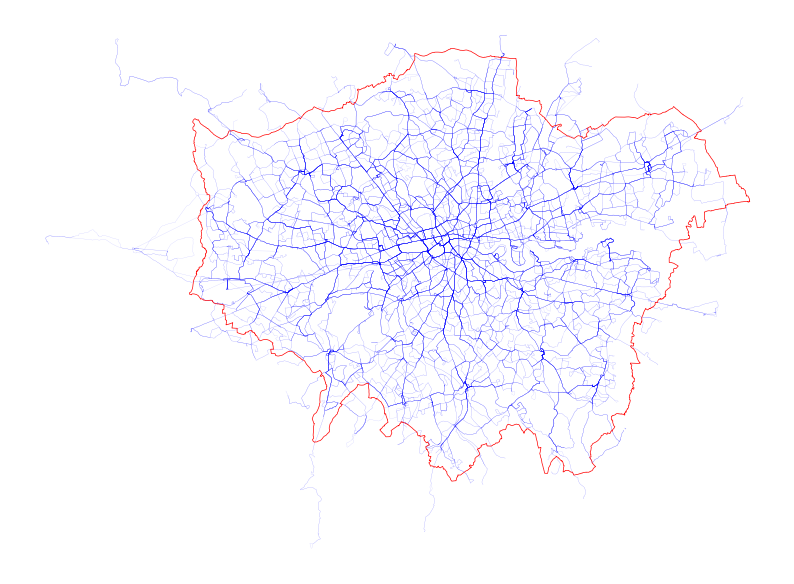

In [11]:
london = ox.geocode_to_gdf('Greater London, UK')
london.to_crs(epsg=27700, inplace=True)

# plot the bus_network
fig, ax = plt.subplots(figsize=(10,10))
bus_segments.plot(ax=ax, color='blue', linewidth=0.2, alpha=0.2)
london.boundary.plot(ax=ax, color='red', linewidth=0.5)
plt.axis('off')
plt.show()

In [12]:
# how many connected components
print(nx.number_connected_components(bus_network))

9


Join nodes within 50/100/150/200m buffer with a walk_link  

In [ ]:
# If nodes are 50m apart, add an edge between them if none, mark these egde's attribute 'routes' as 'walk_link'
# create a new graph with nodes that are 50m apart connected
bus_network_50m = bus_network.copy()
nodes = list(bus_network.nodes())

# add an edge between them if none exists yet
for i in range(len(nodes)):
    for j in range(i+1, len(nodes)):
        if distance.euclidean(bus_network.nodes[nodes[i]]['geometry'].coords[0], bus_network.nodes[nodes[j]]['geometry'].coords[0]) <= 50:
            if not bus_network_50m.has_edge(nodes[i], nodes[j]):
                bus_network_50m.add_edge(nodes[i], nodes[j], routes='walk_link')

# how many connected components
print(nx.number_connected_components(bus_network_50m))

In [17]:
# If nodes are 100m apart, add an edge between them if none, mark these egde's attribute 'routes' as 'walk_link'
# create a new graph with nodes that are 50m apart connected
bus_network_100m = bus_network.copy()
nodes = list(bus_network.nodes())

# add an edge between them if none exists yet
for i in range(len(nodes)):
    for j in range(i+1, len(nodes)):
        if distance.euclidean(bus_network.nodes[nodes[i]]['geometry'].coords[0], bus_network.nodes[nodes[j]]['geometry'].coords[0]) <= 100:
            if not bus_network_100m.has_edge(nodes[i], nodes[j]):
                bus_network_100m.add_edge(nodes[i], nodes[j], routes='walk_link')

# how many connected components
print(nx.number_connected_components(bus_network_100m))

4


In [18]:
# If nodes are 150m apart, add an edge between them if none, mark these egde's attribute 'routes' as 'walk_link'
# create a new graph with nodes that are 50m apart connected
bus_network_150m = bus_network.copy()
nodes = list(bus_network.nodes())

# add an edge between them if none exists yet
for i in range(len(nodes)):
    for j in range(i+1, len(nodes)):
        if distance.euclidean(bus_network.nodes[nodes[i]]['geometry'].coords[0], bus_network.nodes[nodes[j]]['geometry'].coords[0]) <= 150:
            if not bus_network_150m.has_edge(nodes[i], nodes[j]):
                bus_network_150m.add_edge(nodes[i], nodes[j], routes='walk_link')

# how many connected components
print(nx.number_connected_components(bus_network_150m))

2


In [19]:
# If nodes are 200m apart, add an edge between them if none, mark these egde's attribute 'routes' as 'walk_link'
# create a new graph with nodes that are 50m apart connected
bus_network_200m = bus_network.copy()
nodes = list(bus_network.nodes())

# add an edge between them if none exists yet
for i in range(len(nodes)):
    for j in range(i+1, len(nodes)):
        if distance.euclidean(bus_network.nodes[nodes[i]]['geometry'].coords[0], bus_network.nodes[nodes[j]]['geometry'].coords[0]) <= 200:
            if not bus_network_200m.has_edge(nodes[i], nodes[j]):
                bus_network_200m.add_edge(nodes[i], nodes[j], routes='walk_link')

# how many connected components
print(nx.number_connected_components(bus_network_200m))

1


Draw

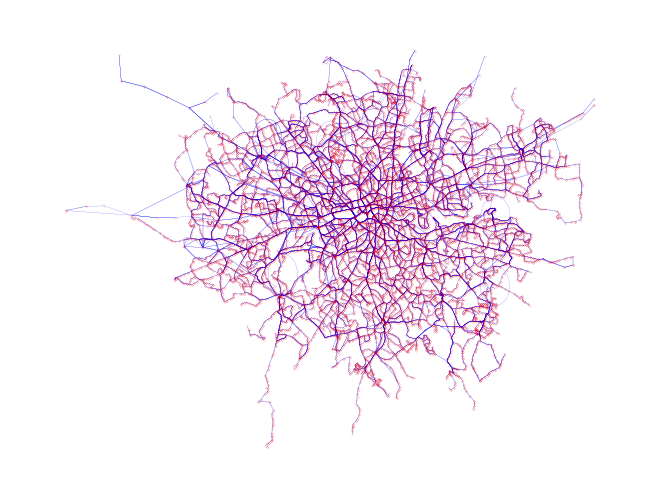

In [57]:
pos = {n: bus_network.nodes[n]['geometry'].coords[0] for n in bus_network.nodes()}

Gcc = nx.connected_components(bus_network_200m) # 1 connected component
for n in Gcc:
    G_sub = bus_network.subgraph(n)
    nx.draw(G_sub, pos,node_size=0.01, node_color='red', edge_color='blue',width=0.1,with_labels=False)
    plt.show()

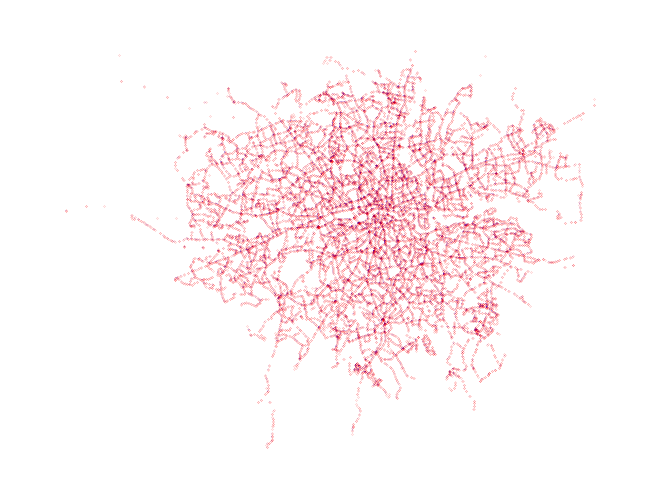

In [65]:
pos = {n: bus_network.nodes[n]['geometry'].coords[0] for n in bus_network.nodes()}

# filter for only edge with edge attribute 'routes' as 'walk_link'
Gcc = nx.connected_components(bus_network_200m) # 1 connected component
for n in Gcc:
    G_sub = bus_network_200m.subgraph(n)
    G_sub = nx.Graph(G_sub)
    G_sub.remove_edges_from([(u,v) for u,v,d in G_sub.edges(data=True) if d['routes'] != 'walk_link'])
    nx.draw(G_sub, pos,node_size=0.01, node_color='red', edge_color='blue',width=0.1,with_labels=False)
    plt.show()


Save all networks

In [22]:
# how to export networkx.classes.graph.Graph to graphml
import pickle

with open('data/cleaned/bus_network_50m.pickle', 'wb') as f:
    pickle.dump(bus_network_50m, f)

with open('data/cleaned/bus_network_100m.pickle', 'wb') as f:
    pickle.dump(bus_network_100m, f)

with open('data/cleaned/bus_network_150m.pickle', 'wb') as f:
    pickle.dump(bus_network_150m, f)

with open('data/cleaned/bus_network_200m.pickle', 'wb') as f:
    pickle.dump(bus_network_200m, f)

# Centrality Measures

Use degree, betweenness, closeness (topological)

In [23]:
G = bus_network_200m

In [24]:
%%time
# Degree centrality is a measure of the number of edges that a node has in the network. 
# It is a measure of how well connected a node is in the network.
deg_london =nx.degree_centrality(G)
nx.set_node_attributes(G,dict(deg_london),'degree')

# Betweenness centrality is a measure of how many times a node lies on the shortest path between other nodes in the network.
bet_london_t=nx.betweenness_centrality(G)
nx.set_node_attributes(G,bet_london_t,'betweenness_t')

# Closeness centrality is a measure of how close a node is to all other nodes in the network.
clo_london_t=nx.closeness_centrality(G)
nx.set_node_attributes(G,clo_london_t,'closeness_t')

CPU times: total: 28min 45s
Wall time: 59min 40s


In [25]:
# Combine all the centrality measures into one dataframe
df = pd.DataFrame()
df['STOP_NAME'] = pd.Series(nx.get_node_attributes(G, 'stop_name'))
df['degree'] = pd.Series(nx.get_node_attributes(G, 'degree'))
df['betweenness_t'] = pd.Series(nx.get_node_attributes(G, 'betweenness_t'))
df['closeness_t'] = pd.Series(nx.get_node_attributes(G, 'closeness_t'))
df['geometry'] = pd.Series(nx.get_node_attributes(G, 'geometry'))

In [32]:
df_sorted = df.sort_values(["betweenness_t"], ascending=False)
df_sorted.reset_index(inplace=True)
df_sorted.rename(columns={'index':'STOP_CODE'}, inplace=True)
df_sorted.head()

,STOP_CODE,STOP_NAME,degree,betweenness_t,closeness_t,geometry
0,6007,North Acton Station,0.001147,0.231159,0.045489,POINT (520865 181875)
1,RR64,Heathrow Central,0.000449,0.208596,0.044479,POINT (507595 175788)
2,688,Ealing Common Station,0.001147,0.186985,0.045795,POINT (518837 180470)
3,37323,Hatton Cross Station,0.000847,0.174294,0.043677,POINT (509649 175443)
4,36996,West Acton Station,0.000349,0.166198,0.045577,POINT (519449 181266)


In [33]:
# convert to geodataframe
df_sorted = gpd.GeoDataFrame(df_sorted, geometry='geometry', crs='epsg:27700')

In [35]:
# convert to hexagon resolution 9 using h3
import h3
import h3pandas

df_hex = df_sorted.copy()
df_hex.to_crs(epsg=4326, inplace=True)	
df_hex = df_hex.h3.geo_to_h3(resolution=10) # get the hexagon id for each point
df_hex = df_hex.h3.h3_to_geo_boundary() # get the boundary of the hexagon
df_hex.to_crs(epsg=27700, inplace=True)	

In [36]:
df_hex.explore()

In [37]:
df_hex.to_file(os.path.join('data','cleaned','bus_cent_h3_r10.gpkg'), driver='GPKG')